In [1]:
import numpy as np
import numpy.ma as ma

import plotly
import plotly.graph_objs as go

plotly.offline.init_notebook_mode()

import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [10, 5]


In [2]:
N = 250
x = np.linspace(-1, 1, N)
y = np.linspace(-1, 1, N)
X, Y = np.meshgrid(x, y)

#Initial condition everywhere inside grid
Z = np.zeros((N, N))

#Boundary conditions
mask = X**2 + Y**2 > 1
Z = np.where(mask, Y**2+Y, Z)

In [3]:
for i in range(20000): #Increase this for more accurate results
    #The new value of each internal point is the average
    #of the values of the points around it
    Z[1:-1, 1:-1] = (Z[0:-2, 1:-1] + Z[2:, 1:-1] + Z[1:-1, 0:-2] + Z[1:-1, 2:]) / 4
    #Impose the boundary conditions
    Z = np.where(mask, Y**2+Y, Z)

In [6]:
Z2 = np.zeros((N, N))

# compute Z2
for xi, x_ in enumerate(np.linspace(-1, 1, N)):
    for yi, y_ in enumerate(np.linspace(-1, 1, N)):
        r2 = x_**2 + y_**2
        Z2[yi, xi] = y_**2 + y_# +1/2-r2/2

trace1 = go.Surface(x=x, y=y, z=Z, colorscale='Viridis')
trace2 = go.Surface(x=x, y=y, z=Z2, colorscale='Greys', opacity=0.5)
data = [trace1, trace2]
layout = go.Layout(
    title='2D Laplace Equation',
    autosize=False,
    width=1500,
    height=1000,
    margin=dict(
        l=65,
        r=50,
        b=65,
        t=90
    )
)
fig = go.Figure(data=data, layout=layout)
plotly.offline.iplot(fig)


In [9]:
Z3 = np.zeros((N, N))

# compute Z2
for xi, x_ in enumerate(np.linspace(-1, 1, N)):
    for yi, y_ in enumerate(np.linspace(-1, 1, N)):
        Z3[yi, xi] = Z2[yi, xi] - Z[yi, xi]


Z4 = np.zeros((N, N))

for xi, x_ in enumerate(np.linspace(-1, 1, N)):
    for yi, y_ in enumerate(np.linspace(-1, 1, N)):
        r2 = x_**2 + y_**2
        if r2<=1:
            Z4[yi, xi] = r2/2
        


trace1 = go.Surface(x=x, y=y, z=Z3, colorscale='Viridis')
trace2 = go.Surface(x=x, y=y, z=Z4, colorscale='Greys', opacity=0.5)
data = [trace1, trace2]
layout = go.Layout(
    title='2D diff',
    autosize=False,
    width=1500,
    height=1000,
    margin=dict(
        l=65,
        r=50,
        b=65,
        t=90
    )
)
fig = go.Figure(data=data, layout=layout)
plotly.offline.iplot(fig)


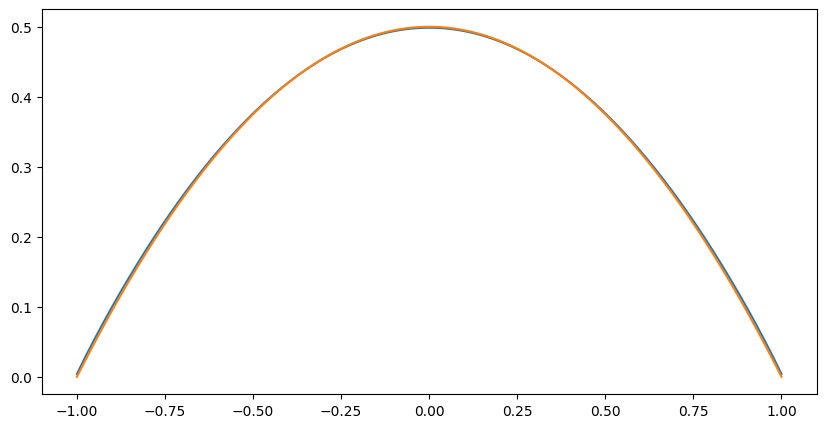

In [6]:
# Slicing the 3D data
x_index = np.argmin(np.abs(x))

x_slice = Z[x_index, :]


xn = np.linspace(-1,1,250)

plt.plot(xn, x_slice)
plt.plot(xn, -(xn**2)/2+1/2)